In [1]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.lines as mlines

In [2]:


def extract_metrics(content):

    patterns = {
        "Only_KNAPSACK_efficiency": r"Only KNAPSACK\s+efficiency:\s+([\d.]+)",
        "Final_Knapsack_time": r"Final Knapsack time:\s+([\d.]+)",
        "Only_SFC_efficiency": r"Only SFC\s+efficiency:\s+([\d.]+)",
        "Final_SFC_time": r"Final SFC time:\s+([\d.]+)",
        "SFC_painterPartition_efficiency": r"SFC\+painterPartition\s+efficiency:\s+([\d.]+)",
        "Final_SFC_Painter_time": r"Final SFC\+Painter time:\s+([\d.]+)",
        "SFC_Knapsack_combined_efficiency": r"SFC\+Knapsack combined efficiency:\s+([\d.]+)",
        "Final_SFC_Knapsack_Combined_time": r"Final SFC\+Knapsack_Combined time:\s+([\d.]+)",
    }

    run_sections = re.split(r"=== Starting Run \d+ ===", content)[1:]  
    data = []

    for run_id, section in enumerate(run_sections, start=1):
        row = {"Run": run_id}
        for key, pattern in patterns.items():
            match = re.search(pattern, section)
            if match:
                row[key] = float(match.group(1))
            else:
                row[key] = None  
        data.append(row)
    
    return data


def consolidate_data_from_files(file_list):
    all_data = []
    
    for file_path in file_list:
        with open(file_path, 'r') as file:
            content = file.read()
        
        file_data = extract_metrics(content)
        for row in file_data:
            row["File"] = file_path
        all_data.extend(file_data)
    
    return pd.DataFrame(all_data)

file_paths = ['./output/2_4_output_best.txt', './output/2_8_output_best.txt', './output/2_16_output_best.txt',
              './output/4_4_output_best.txt', './output/4_8_output_best.txt', './output/4_16_output_best.txt',
              './output/8_4_output_best.txt', './output/8_8_output_best.txt', './output/8_16_output_best.txt',
              './output/16_4_output_best.txt', './output/16_8_output_best.txt', './output/16_16_output_best.txt',
              './output/32_4_output_best.txt', './output/32_8_output_best.txt', './output/32_16_output_best.txt',
              './output/64_4_output_best.txt', './output/64_8_output_best.txt', './output/64_16_output_best.txt',
              './output/128_4_output_best.txt', './output/128_8_output_best.txt', './output/128_16_output_best.txt']


result_df = consolidate_data_from_files(file_paths)




In [3]:
result_df

,Run,Only_KNAPSACK_efficiency,Final_Knapsack_time,Only_SFC_efficiency,Final_SFC_time,SFC_painterPartition_efficiency,Final_SFC_Painter_time,SFC_Knapsack_combined_efficiency,Final_SFC_Knapsack_Combined_time,File
0,1,0.999949,0.013066,0.999501,0.010176,0.999501,0.000190,0.997411,0.012020,./output/2_4_output_best.txt
1,2,0.999967,0.003170,0.998913,0.005071,0.998913,0.000164,0.996170,0.003943,./output/2_4_output_best.txt
2,3,0.999754,0.003499,0.999898,0.005383,0.999898,0.000166,0.998090,0.004294,./output/2_4_output_best.txt
3,4,0.999884,0.003394,0.800066,0.005063,0.999628,0.000155,0.500839,0.003195,./output/2_4_output_best.txt
4,5,0.999498,0.003069,0.999172,0.005424,0.999172,0.000384,0.996389,0.003519,./output/2_4_output_best.txt
...,...,...,...,...,...,...,...,...,...,...
2095,96,0.999807,0.050827,0.800952,0.028839,0.996669,0.000328,0.501420,0.050932,./output/128_16_output_best.txt
2096,97,0.999716,0.046994,0.800636,0.029114,0.997022,0.000697,0.501546,0.050830,./output/128_16_output_best.txt
2097,98,0.999753,0.047288,0.800086,0.031150,0.996934,0.000274,0.501112,0.049804,./output/128_16_output_best.txt
2098,99,0.999726,0.047009,0.800386,0.027695,0.997167,0.000300,0.500921,0.051402,./output/128_16_output_best.txt


In [4]:
result_df.head(100)

,Run,Only_KNAPSACK_efficiency,Final_Knapsack_time,Only_SFC_efficiency,Final_SFC_time,SFC_painterPartition_efficiency,Final_SFC_Painter_time,SFC_Knapsack_combined_efficiency,Final_SFC_Knapsack_Combined_time,File
0,1,0.999949,0.013066,0.999501,0.010176,0.999501,0.000190,0.997411,0.012020,./output/2_4_output_best.txt
1,2,0.999967,0.003170,0.998913,0.005071,0.998913,0.000164,0.996170,0.003943,./output/2_4_output_best.txt
2,3,0.999754,0.003499,0.999898,0.005383,0.999898,0.000166,0.998090,0.004294,./output/2_4_output_best.txt
3,4,0.999884,0.003394,0.800066,0.005063,0.999628,0.000155,0.500839,0.003195,./output/2_4_output_best.txt
4,5,0.999498,0.003069,0.999172,0.005424,0.999172,0.000384,0.996389,0.003519,./output/2_4_output_best.txt
...,...,...,...,...,...,...,...,...,...,...
95,96,0.999878,0.003754,0.999700,0.005075,0.999700,0.000156,0.996193,0.003472,./output/2_4_output_best.txt
96,97,0.999803,0.004090,0.800277,0.005281,0.999150,0.000161,0.501047,0.003514,./output/2_4_output_best.txt
97,98,0.999974,0.055911,0.999635,0.006564,0.999635,0.000361,0.997046,0.003935,./output/2_4_output_best.txt
98,99,0.999966,0.003523,0.999606,0.005635,0.999606,0.000208,0.997887,0.003871,./output/2_4_output_best.txt


In [5]:
result_df['File'] = result_df['File'].apply(lambda x: os.path.splitext(os.path.basename(x))[0])

In [6]:
result_df['File'] = result_df['File'].apply(lambda x: '_'.join([word.capitalize() for word in x.split('_')]))

In [7]:
result_df

,Run,Only_KNAPSACK_efficiency,Final_Knapsack_time,Only_SFC_efficiency,Final_SFC_time,SFC_painterPartition_efficiency,Final_SFC_Painter_time,SFC_Knapsack_combined_efficiency,Final_SFC_Knapsack_Combined_time,File
0,1,0.999949,0.013066,0.999501,0.010176,0.999501,0.000190,0.997411,0.012020,2_4_Output_Best
1,2,0.999967,0.003170,0.998913,0.005071,0.998913,0.000164,0.996170,0.003943,2_4_Output_Best
2,3,0.999754,0.003499,0.999898,0.005383,0.999898,0.000166,0.998090,0.004294,2_4_Output_Best
3,4,0.999884,0.003394,0.800066,0.005063,0.999628,0.000155,0.500839,0.003195,2_4_Output_Best
4,5,0.999498,0.003069,0.999172,0.005424,0.999172,0.000384,0.996389,0.003519,2_4_Output_Best
...,...,...,...,...,...,...,...,...,...,...
2095,96,0.999807,0.050827,0.800952,0.028839,0.996669,0.000328,0.501420,0.050932,128_16_Output_Best
2096,97,0.999716,0.046994,0.800636,0.029114,0.997022,0.000697,0.501546,0.050830,128_16_Output_Best
2097,98,0.999753,0.047288,0.800086,0.031150,0.996934,0.000274,0.501112,0.049804,128_16_Output_Best
2098,99,0.999726,0.047009,0.800386,0.027695,0.997167,0.000300,0.500921,0.051402,128_16_Output_Best


In [8]:
result_df = result_df.rename(columns={'Only_KNAPSACK_efficiency': 'Only_Knapsack_Efficiency', 'Final_Knapsack_time': 'Only_Knapsack_Final_Time', 'Only_SFC_efficiency':'Only_SFC_Efficiency','Final_SFC_time': 'Only_SFC_Final_Time','SFC_painterPartition_efficiency': 'SFC_PainterPartition_Efficiency','Final_SFC_Painter_time': 'SFC_PainterPartition_Final_Time','SFC_Knapsack_combined_efficiency':'SFC_Knapsack_Combined_Efficiency','Final_SFC_Knapsack_Combined_time':'SFC_Knapsack_Combined_Final_Time'} )

In [9]:
result_df

,Run,Only_Knapsack_Efficiency,Only_Knapsack_Final_Time,Only_SFC_Efficiency,Only_SFC_Final_Time,SFC_PainterPartition_Efficiency,SFC_PainterPartition_Final_Time,SFC_Knapsack_Combined_Efficiency,SFC_Knapsack_Combined_Final_Time,File
0,1,0.999949,0.013066,0.999501,0.010176,0.999501,0.000190,0.997411,0.012020,2_4_Output_Best
1,2,0.999967,0.003170,0.998913,0.005071,0.998913,0.000164,0.996170,0.003943,2_4_Output_Best
2,3,0.999754,0.003499,0.999898,0.005383,0.999898,0.000166,0.998090,0.004294,2_4_Output_Best
3,4,0.999884,0.003394,0.800066,0.005063,0.999628,0.000155,0.500839,0.003195,2_4_Output_Best
4,5,0.999498,0.003069,0.999172,0.005424,0.999172,0.000384,0.996389,0.003519,2_4_Output_Best
...,...,...,...,...,...,...,...,...,...,...
2095,96,0.999807,0.050827,0.800952,0.028839,0.996669,0.000328,0.501420,0.050932,128_16_Output_Best
2096,97,0.999716,0.046994,0.800636,0.029114,0.997022,0.000697,0.501546,0.050830,128_16_Output_Best
2097,98,0.999753,0.047288,0.800086,0.031150,0.996934,0.000274,0.501112,0.049804,128_16_Output_Best
2098,99,0.999726,0.047009,0.800386,0.027695,0.997167,0.000300,0.500921,0.051402,128_16_Output_Best


In [10]:
column_list = result_df['SFC_Knapsack_Combined_Efficiency'].tolist()

In [11]:
print(column_list)

[0.9974106984, 0.9961698658, 0.9980904729, 0.5008386496, 0.9963890419, 0.9957912263, 0.5016258582, 0.9946437689, 0.5014381221, 0.5010076755, 0.5015903955, 0.9955445693, 0.9968143914, 0.9956935003, 0.5017969468, 0.5011449706, 0.5009688117, 0.5015113153, 0.5019387666, 0.5006395284, 0.9970392821, 0.9959934096, 0.9976970748, 0.9962052208, 0.5009332128, 0.9978418359, 0.5016550485, 0.9967064946, 0.997277496, 0.5010932747, 0.9953134929, 0.5017453563, 0.5014255929, 0.5013369014, 0.501393861, 0.9952319491, 0.5010271651, 0.5009150465, 0.9967755075, 0.997024598, 0.501292027, 0.9973627188, 0.9974167589, 0.9955522896, 0.5010638388, 0.5011407629, 0.5012061532, 0.9974378729, 0.9979364621, 0.5026992698, 0.9977112354, 0.5011376205, 0.502230934, 0.5015331007, 0.9970139148, 0.9970802325, 0.9972951115, 0.5015067471, 0.9968045576, 0.997375647, 0.99762393, 0.5010079943, 0.9968156944, 0.9980692031, 0.9985310078, 0.9956840526, 0.5010627919, 0.9961416855, 0.9955396815, 0.9972576204, 0.9966426969, 0.5008435522,

In [12]:
# output_file = "./result/data.xlsx"

# with pd.ExcelWriter(output_file, engine='xlsxwriter') as writer:
#     for file_name, group in result_df.groupby('File', sort=False):
#         sheet_name = file_name.split("/")[-1].replace(".txt", "")
#         group.to_excel(writer, sheet_name=sheet_name, index=False)


In [13]:
filename = '2_4_Output_Best'
df_1 = result_df[result_df['File'] == filename]

In [14]:
df_1

,Run,Only_Knapsack_Efficiency,Only_Knapsack_Final_Time,Only_SFC_Efficiency,Only_SFC_Final_Time,SFC_PainterPartition_Efficiency,SFC_PainterPartition_Final_Time,SFC_Knapsack_Combined_Efficiency,SFC_Knapsack_Combined_Final_Time,File
0,1,0.999949,0.013066,0.999501,0.010176,0.999501,0.000190,0.997411,0.012020,2_4_Output_Best
1,2,0.999967,0.003170,0.998913,0.005071,0.998913,0.000164,0.996170,0.003943,2_4_Output_Best
2,3,0.999754,0.003499,0.999898,0.005383,0.999898,0.000166,0.998090,0.004294,2_4_Output_Best
3,4,0.999884,0.003394,0.800066,0.005063,0.999628,0.000155,0.500839,0.003195,2_4_Output_Best
4,5,0.999498,0.003069,0.999172,0.005424,0.999172,0.000384,0.996389,0.003519,2_4_Output_Best
...,...,...,...,...,...,...,...,...,...,...
95,96,0.999878,0.003754,0.999700,0.005075,0.999700,0.000156,0.996193,0.003472,2_4_Output_Best
96,97,0.999803,0.004090,0.800277,0.005281,0.999150,0.000161,0.501047,0.003514,2_4_Output_Best
97,98,0.999974,0.055911,0.999635,0.006564,0.999635,0.000361,0.997046,0.003935,2_4_Output_Best
98,99,0.999966,0.003523,0.999606,0.005635,0.999606,0.000208,0.997887,0.003871,2_4_Output_Best


In [15]:
pd.set_option('display.max_columns', None)

/tmp/ipykernel_1414199/3753675908.py:11: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = result_df.groupby('File', sort=False)


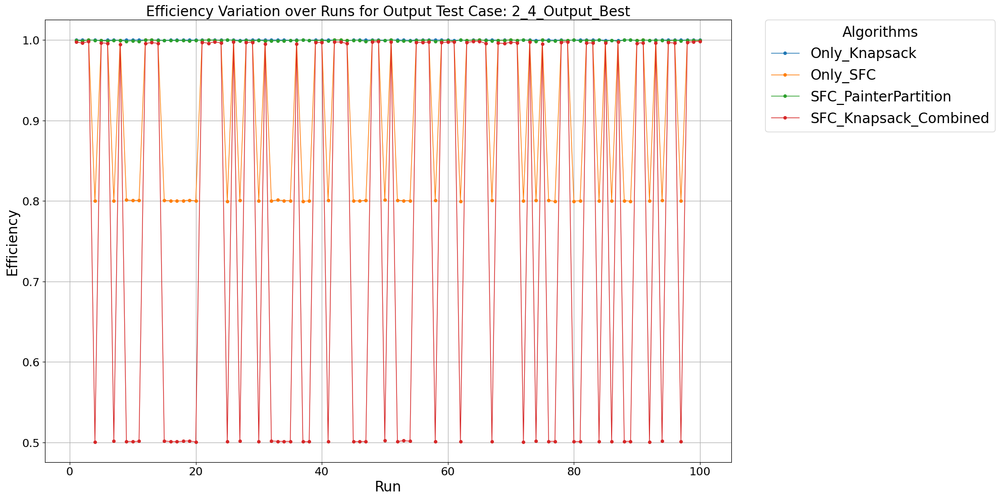

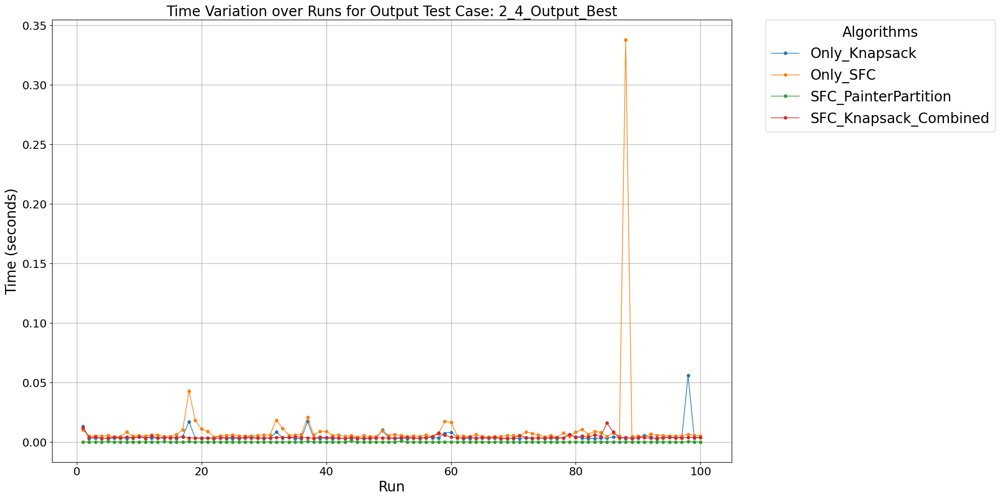

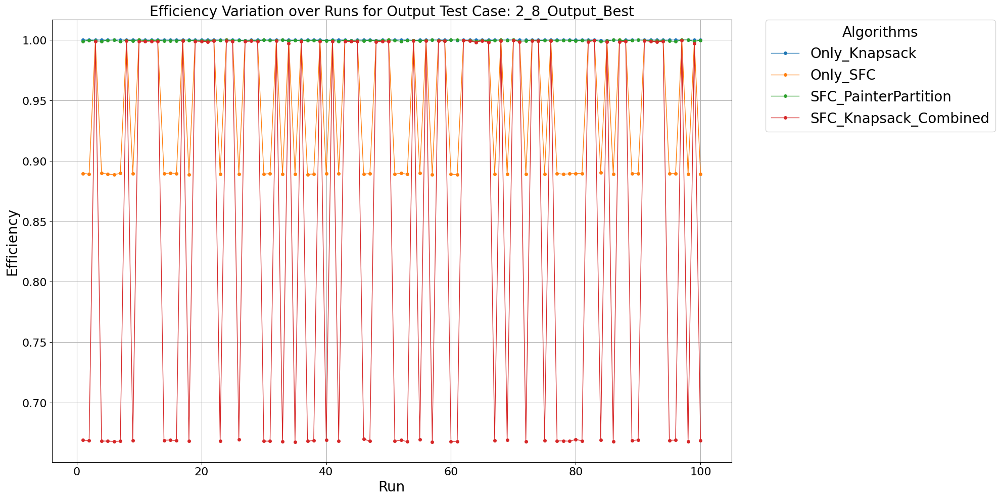

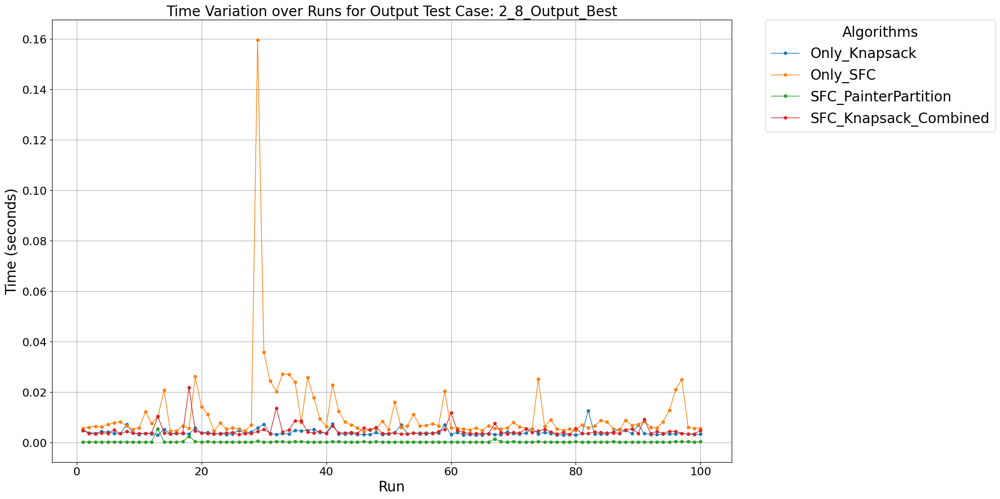

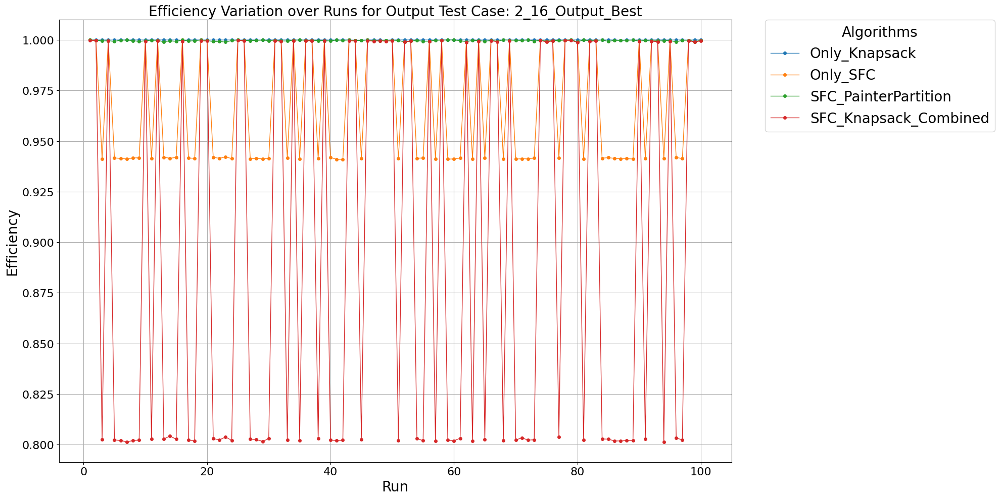

...

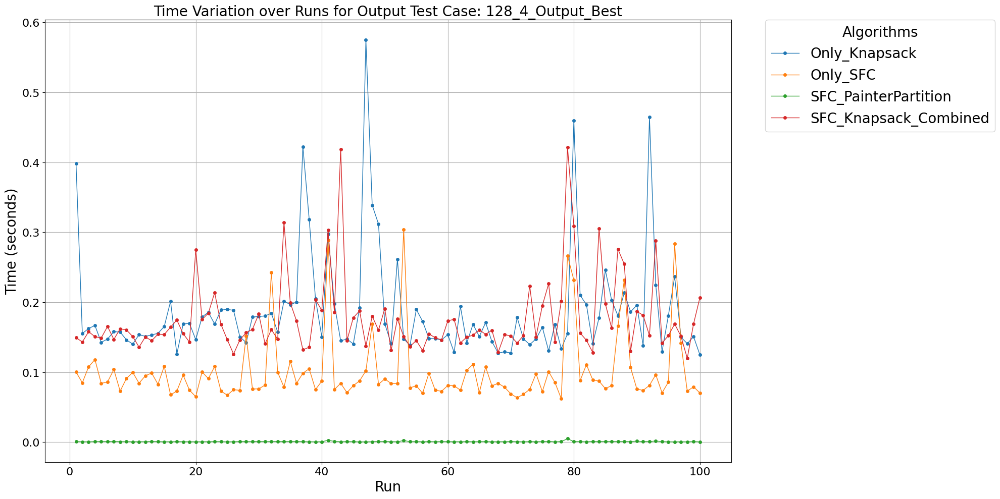

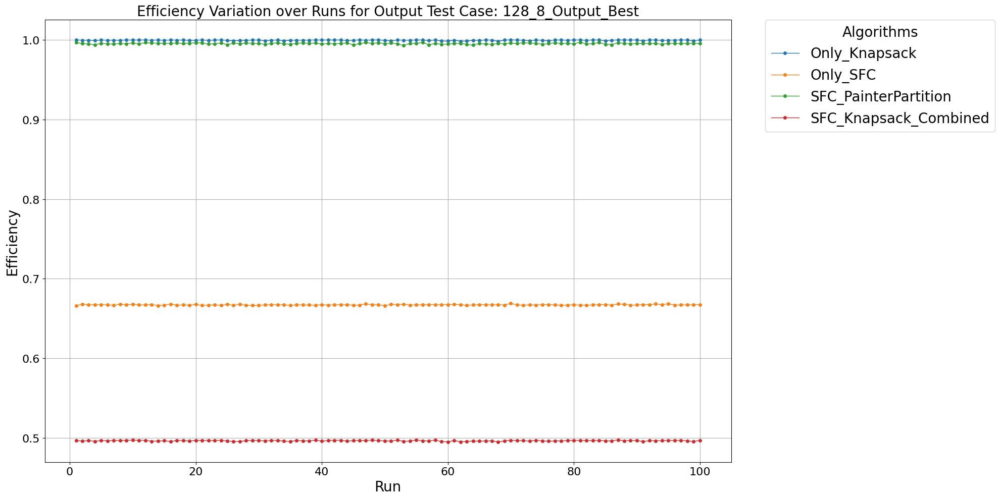

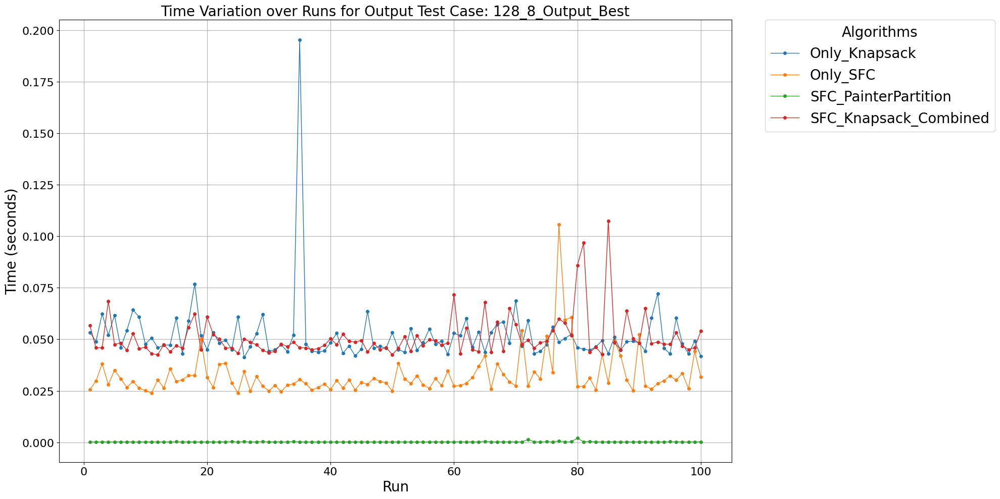

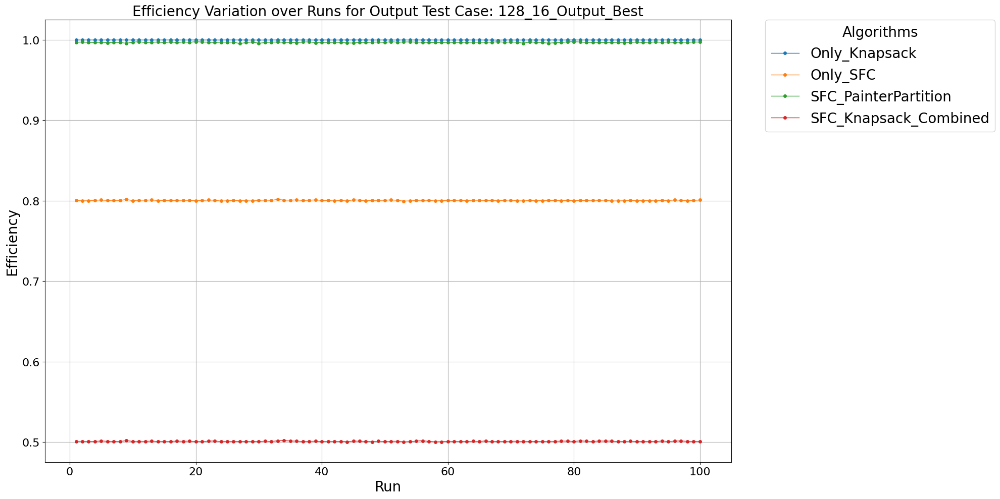

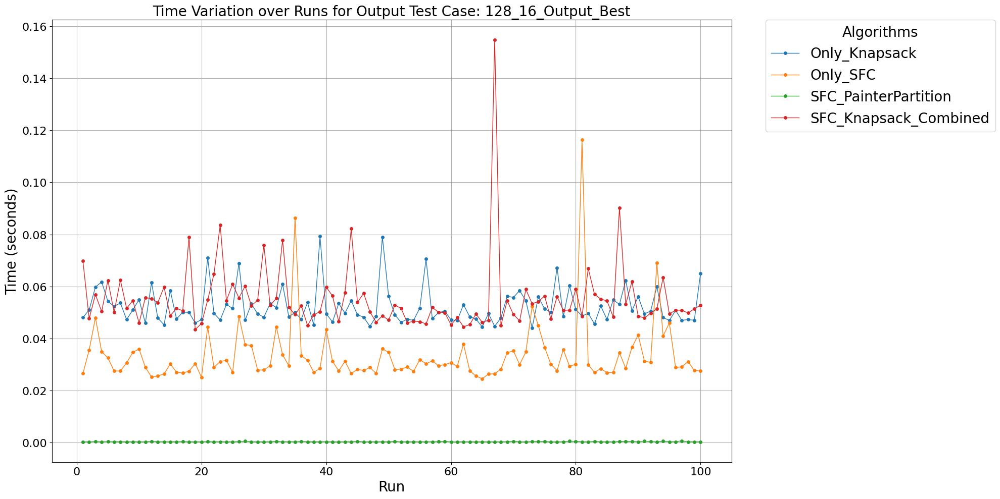

In [58]:
algorithms = [
    ('Only_Knapsack', 'Only_Knapsack_Efficiency', 'Only_Knapsack_Final_Time'),
    ('Only_SFC', 'Only_SFC_Efficiency', 'Only_SFC_Final_Time'),
    ('SFC_PainterPartition', 'SFC_PainterPartition_Efficiency', 'SFC_PainterPartition_Final_Time'),
    ('SFC_Knapsack_Combined', 'SFC_Knapsack_Combined_Efficiency', 'SFC_Knapsack_Combined_Final_Time')
]

file_order = result_df['File'].drop_duplicates().tolist()
result_df['File'] = pd.Categorical(result_df['File'], categories=file_order, ordered=True)

grouped = result_df.groupby('File', sort=False)

for file_name, group in grouped:
    group = group.sort_values('Run')

    fig, ax = plt.subplots(figsize=(20, 10))
    ax.set_title(f'Efficiency Variation over Runs for Output Test Case: {file_name}', fontsize=20)
    ax.set_xlabel('Run', fontsize=20)
    ax.set_ylabel('Efficiency', fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    for alg_name, eff_col, _ in algorithms:
        ax.plot(group['Run'], group[eff_col], label=alg_name, marker='o', linestyle='-', linewidth=1, markersize=4)

    ax.legend(title='Algorithms', title_fontsize=20, fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    ax.grid(True)
    plt.tight_layout()
    efficiency_filename = f'./result/all_run_data/{file_name}_efficiency.png'
    plt.savefig(efficiency_filename, dpi=600)
    plt.show()
    fig, ax = plt.subplots(figsize=(20, 10))
    ax.set_title(f'Time Variation over Runs for Output Test Case: {file_name}', fontsize=20)
    ax.set_xlabel('Run', fontsize=20)
    ax.set_ylabel('Time (seconds)', fontsize=20)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)

    for alg_name, _, time_col in algorithms:
        ax.plot(group['Run'], group[time_col], label=alg_name, marker='o', linestyle='-', linewidth=1, markersize=4)

    ax.legend(title='Algorithms', title_fontsize=20, fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    ax.grid(True)
    plt.tight_layout()
    time_filename = f'./result/all_run_data/{file_name}_time.png'
    plt.savefig(time_filename, dpi=600)
    plt.show()


In [64]:
file_order = result_df['File'].drop_duplicates().tolist()
result_df['File'] = pd.Categorical(result_df['File'], categories=file_order, ordered=True)

grouped = result_df.groupby('File', sort=False)


/tmp/ipykernel_1414199/3567121358.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = result_df.groupby('File', sort=False)


In [66]:
specific_group = grouped.get_group('128_4_Output_Best')
specific_group

,Run,Only_Knapsack_Efficiency,Only_Knapsack_Final_Time,Only_SFC_Efficiency,Only_SFC_Final_Time,SFC_PainterPartition_Efficiency,SFC_PainterPartition_Final_Time,SFC_Knapsack_Combined_Efficiency,SFC_Knapsack_Combined_Final_Time,File
1800,1,0.994909,0.397956,0.994909,0.100175,0.994909,0.000753,0.248727,0.149465,128_4_Output_Best
1801,2,0.991467,0.155258,0.991467,0.084853,0.991467,0.000409,0.247867,0.143049,128_4_Output_Best
1802,3,0.993811,0.162398,0.993811,0.107633,0.993811,0.000399,0.248453,0.157868,128_4_Output_Best
1803,4,0.994448,0.166768,0.994448,0.118055,0.994448,0.000605,0.248612,0.150714,128_4_Output_Best
1804,5,0.993543,0.142608,0.993543,0.083972,0.993543,0.001238,0.248386,0.148896,128_4_Output_Best
...,...,...,...,...,...,...,...,...,...,...
1895,96,0.993404,0.236387,0.993404,0.283315,0.993404,0.000305,0.248351,0.168881,128_4_Output_Best
1896,97,0.994664,0.149983,0.994664,0.141433,0.994664,0.000451,0.248666,0.151354,128_4_Output_Best
1897,98,0.994384,0.140804,0.994384,0.072824,0.994384,0.000319,0.248596,0.119761,128_4_Output_Best
1898,99,0.991254,0.150823,0.991254,0.079157,0.991254,0.000696,0.247814,0.169023,128_4_Output_Best


In [17]:
efficiency_cols = [
    'Only_Knapsack_Efficiency',
    'SFC_PainterPartition_Efficiency',
    'Only_SFC_Efficiency',
    'SFC_Knapsack_Combined_Efficiency'
]

time_cols = [
    'Only_Knapsack_Final_Time',
    'SFC_PainterPartition_Final_Time',
    'Only_SFC_Final_Time',
    'SFC_Knapsack_Combined_Final_Time'
]

all_cols = efficiency_cols + time_cols

unique_files = result_df['File'].drop_duplicates()
result_df['File'] = pd.Categorical(result_df['File'], categories=unique_files, ordered=True)
agg_funcs = {col: ['mean', 'std', 'min', 'max'] for col in all_cols}
grouped = result_df.groupby('File', sort=False).agg(agg_funcs)
grouped.columns = ['_'.join(col).strip() for col in grouped.columns.values]
grouped = grouped.reset_index()
grouped['File'] = pd.Categorical(grouped['File'], categories=unique_files, ordered=True)
grouped = grouped.sort_values('File')

/tmp/ipykernel_2073626/3674146322.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = result_df.groupby('File', sort=False).agg(agg_funcs)


In [18]:
grouped

,File,Only_Knapsack_Efficiency_mean,Only_Knapsack_Efficiency_std,Only_Knapsack_Efficiency_min,Only_Knapsack_Efficiency_max,SFC_PainterPartition_Efficiency_mean,SFC_PainterPartition_Efficiency_std,SFC_PainterPartition_Efficiency_min,SFC_PainterPartition_Efficiency_max,Only_SFC_Efficiency_mean,Only_SFC_Efficiency_std,Only_SFC_Efficiency_min,Only_SFC_Efficiency_max,SFC_Knapsack_Combined_Efficiency_mean,SFC_Knapsack_Combined_Efficiency_std,SFC_Knapsack_Combined_Efficiency_min,SFC_Knapsack_Combined_Efficiency_max,Only_Knapsack_Final_Time_mean,Only_Knapsack_Final_Time_std,Only_Knapsack_Final_Time_min,Only_Knapsack_Final_Time_max,SFC_PainterPartition_Final_Time_mean,SFC_PainterPartition_Final_Time_std,SFC_PainterPartition_Final_Time_min,SFC_PainterPartition_Final_Time_max,Only_SFC_Final_Time_mean,Only_SFC_Final_Time_std,Only_SFC_Final_Time_min,Only_SFC_Final_Time_max,SFC_Knapsack_Combined_Final_Time_mean,SFC_Knapsack_Combined_Final_Time_std,SFC_Knapsack_Combined_Final_Time_min,SFC_Knapsack_Combined_Final_Time_max
0,2_4_Output_Best,0.999858,0.000145,0.999167,0.999999,0.999359,0.000470,0.998126,0.999997,0.911840,0.099339,0.799466,0.999991,0.778783,0.247178,0.500640,0.998531,0.004633,0.005707,0.002829,0.055911,0.000204,0.000119,0.000140,0.000954,0.010350,0.033404,0.004093,0.337605,0.004080,0.001697,0.002999,0.016212
1,2_8_Output_Best,0.999939,0.000059,0.999668,0.999998,0.999480,0.000359,0.998655,0.999997,0.947655,0.055284,0.888533,0.999984,0.843574,0.165754,0.667430,0.999797,0.003939,0.001332,0.002935,0.012486,0.000288,0.000574,0.000143,0.005411,0.010956,0.016441,0.004286,0.159472,0.004551,0.002455,0.003060,0.021776
2,2_16_Output_Best,0.999974,0.000028,0.999862,1.000000,0.999652,0.000265,0.998922,0.999998,0.968825,0.029194,0.940980,0.999983,0.895014,0.098834,0.801321,0.999789,0.004948,0.003901,0.003394,0.037659,0.000208,0.000089,0.000141,0.000734,0.011263,0.008936,0.005253,0.044389,0.005152,0.003644,0.003589,0.030857
3,4_4_Output_Best,0.999792,0.000131,0.999458,0.999981,0.998712,0.000589,0.997180,0.999747,0.858147,0.090340,0.799042,0.999684,0.644867,0.225489,0.500467,0.997453,0.006920,0.011269,0.003478,0.088394,0.000286,0.000313,0.000147,0.001912,0.010584,0.007599,0.005208,0.044001,0.004704,0.001723,0.003507,0.014993
4,4_8_Output_Best,0.999903,0.000063,0.999703,0.999987,0.999115,0.000420,0.997640,0.999948,0.916906,0.047683,0.888629,0.999948,0.751113,0.143540,0.667313,0.999226,0.005325,0.001126,0.004046,0.010090,0.000338,0.000530,0.000155,0.003770,0.013935,0.011748,0.005565,0.076241,0.006395,0.002863,0.004372,0.023110
5,4_16_Output_Best,0.999957,0.000026,0.999885,0.999996,0.999354,0.000283,0.998567,0.999902,0.953766,0.023630,0.940997,0.999805,0.843864,0.080468,0.801407,0.999534,0.008518,0.025149,0.004441,0.256300,0.000246,0.000203,0.000149,0.002015,0.011925,0.007994,0.005703,0.056507,0.005603,0.000999,0.004470,0.010171
6,8_4_Output_Best,0.999904,0.000041,0.999795,0.999966,0.998745,0.000428,0.997266,0.999629,0.898170,0.029794,0.888569,0.999629,0.694894,0.089805,0.667092,0.998552,0.006591,0.002234,0.005355,0.026887,0.000196,0.000054,0.000150,0.000580,0.010720,0.009633,0.006007,0.093884,0.006360,0.000846,0.005429,0.010660
7,8_8_Output_Best,0.999954,0.000019,0.999910,0.999992,0.999088,0.000341,0.997884,0.999681,0.947354,0.017263,0.940896,0.999481,0.822100,0.059136,0.801412,0.999168,0.007002,0.004038,0.005190,0.033316,0.000204,0.000057,0.000156,0.000625,0.009395,0.005765,0.005987,0.041104,0.006760,0.001171,0.005540,0.012458
8,8_16_Output_Best,0.999979,0.000008,0.999959,0.999994,0.999332,0.000205,0.998755,0.999709,0.975324,0.011327,0.969564,0.999678,0.909389,0.042333,0.889200,0.999631,0.010316,0.029046,0.005291,0.294824,0.001149,0.008739,0.000186,0.087652,0.015960,0.012503,0.005770,0.066786,0.009777,0.018674,0.005708,0.178892
9,16_4_Output_Best,0.999892,0.000038,0.999783,0.999976,0.998435,0.000441,0.997122,0.999345,0.893796,0.021433,0.888591,0.998588,0.681673,0.064798,0.667070,0.998155,0.013198,0.025690,0.007830,0.266687,0.000279,0.000366,0.00

In [19]:
# algorithms = [
#     ('Only_Knapsack', 'Only_Knapsack_Efficiency', 'Only_Knapsack_Final_Time'),
#     ('Only_SFC', 'Only_SFC_Efficiency', 'Only_SFC_Final_Time'),
#     ('SFC_PainterPartition', 'SFC_PainterPartition_Efficiency', 'SFC_PainterPartition_Final_Time'),
#     ('SFC_Knapsack_Combined', 'SFC_Knapsack_Combined_Efficiency', 'SFC_Knapsack_Combined_Final_Time')
# ]

# Error Bar Plot

Mean values for each algorithm and file as the central point.
Variability using error bars for standard deviations.

Use a bar or point plot for the mean and add error bars based on the standard deviation.
Place all algorithms side-by-side (grouped bars) or overlay them to compare their average performance and variability for each file.


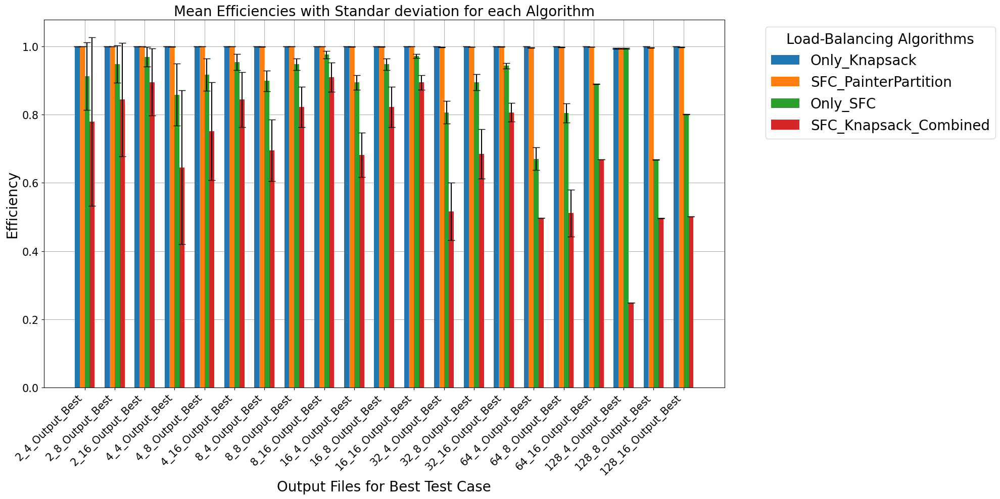

In [20]:
algorithms = ['Only_Knapsack', 'SFC_PainterPartition', 'Only_SFC', 'SFC_Knapsack_Combined']
fig, ax = plt.subplots(figsize=(20, 10))
width = 1  
num_algorithms = len(algorithms)
group_gap = 2  
x_spacing = num_algorithms * width + group_gap
x = np.arange(len(grouped['File'])) * x_spacing

for i, alg in enumerate(algorithms):
    mean_col = f'{alg}_Efficiency_mean'
    std_col = f'{alg}_Efficiency_std'
    ax.bar(x + i * width, grouped[mean_col], width,
           yerr=grouped[std_col], capsize=5, label=alg)
    
ax.grid(True)
ax.set_axisbelow(True)
ax.set_xlabel('Output Files for Best Test Case', fontsize=20)
ax.set_ylabel('Efficiency', fontsize=20)
ax.set_title('Mean Efficiencies with Standar deviation for each Algorithm', fontsize=20)
ax.set_xticks(x + width * (num_algorithms - 1) / 2)
ax.set_xticklabels(grouped['File'], rotation=45, ha='right')
ax.tick_params(axis='both', which='major', labelsize=15)
ax.legend(title='Load-Balancing Algorithms', title_fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20)

plt.margins(x=0.05)
plt.tight_layout()
plt.savefig('./result/efficiency_errorbarplot.png', dpi=600)
plt.show()

In [ ]:
# algorithms = [
#     ('Only_Knapsack', 'Only_Knapsack_Efficiency', 'Only_Knapsack_Final_Time'),
#     ('Only_SFC', 'Only_SFC_Efficiency', 'Only_SFC_Final_Time'),
#     ('SFC_PainterPartition', 'SFC_PainterPartition_Efficiency', 'SFC_PainterPartition_Final_Time'),
#     ('SFC_Knapsack_Combined', 'SFC_Knapsack_Combined_Efficiency', 'SFC_Knapsack_Combined_Final_Time')
# ]

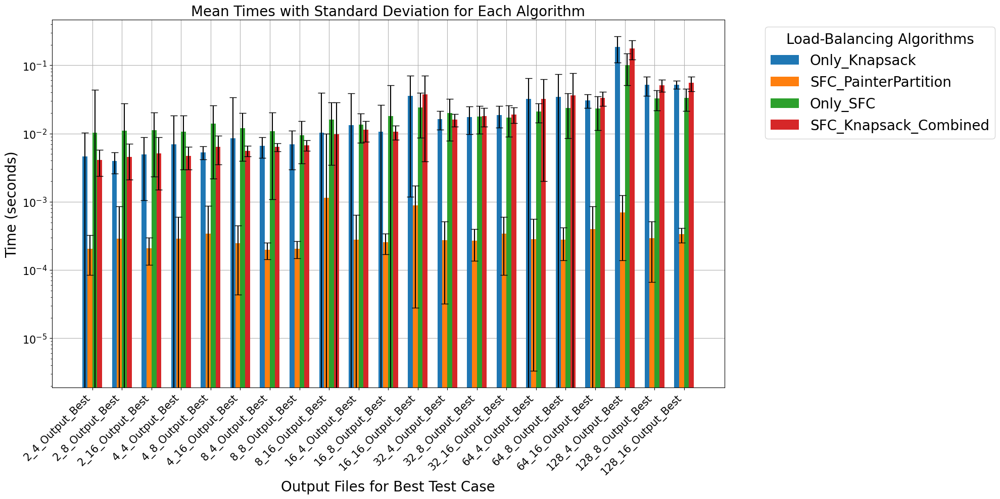

In [22]:

time = ['Only_Knapsack', 'SFC_PainterPartition', 'Only_SFC', 'SFC_Knapsack_Combined']
fig, ax = plt.subplots(figsize=(20, 10))
width = 1  
num_algorithms = len(time)
group_gap = 2  
x_spacing = num_algorithms * width + group_gap
x = np.arange(len(grouped['File'])) * x_spacing

for i, alg in enumerate(time):
    mean_col = f'{alg}_Final_Time_mean'
    std_col = f'{alg}_Final_Time_std'
    ax.bar(x + i * width, grouped[mean_col], width,
           yerr=grouped[std_col], capsize=5, label=alg)
ax.grid(True)
ax.set_axisbelow(True)
# Set y-axis to logarithmic scale
ax.set_yscale('log')

ax.set_xlabel('Output Files for Best Test Case', fontsize=20)
ax.set_ylabel('Time (seconds)', fontsize=20)
ax.set_title('Mean Times with Standard Deviation for Each Algorithm', fontsize=20)
ax.set_xticks(x + width*(len(time)-1)/2)
ax.set_xticklabels(grouped['File'], rotation=45, ha='right')
ax.tick_params(axis='both', which='major', labelsize=15)
ax.legend(title='Load-Balancing Algorithms', title_fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20)
plt.margins(x=0.05)
plt.tight_layout()
plt.savefig('./result/time_errorbarplot.png', dpi=600)
plt.show()

In [82]:
algorithms = ['Only_Knapsack', 'SFC_PainterPartition', 'Only_SFC', 'SFC_Knapsack_Combined']

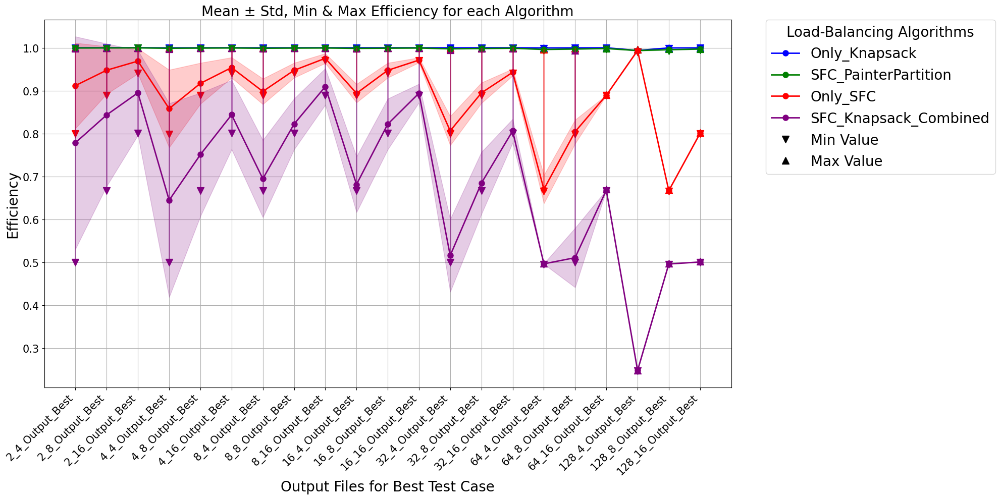

In [88]:
# fig, ax = plt.subplots(figsize=(20, 10))

# for i, alg in enumerate(algorithms):
#     mean_col = f'{alg}_Efficiency_mean'
#     std_col = f'{alg}_Efficiency_std'
#     min_col = mean_col.replace('_mean', '_min')
#     max_col = mean_col.replace('_mean', '_max')
#     ax.plot(x, grouped[mean_col], marker='o', label=alg)
#     ax.fill_between(
#         x, 
#         grouped[mean_col] - grouped[std_col],
#         grouped[mean_col] + grouped[std_col],
#         alpha=0.2
#     )
#     for j, file_name in enumerate(grouped['File']):
#         ax.plot([x[j], x[j]], 
#                 [grouped[min_col].iloc[j], grouped[max_col].iloc[j]],
#                 color='grey', alpha=0.5)

# ax.set_xticks(x)
# ax.set_xticklabels(grouped['File'], rotation=45, ha='right')
# ax.set_xlabel('File', fontsize=15)
# ax.set_ylabel('Efficiency', fontsize=15)
# ax.set_title('Mean ± Std, Min & Max Efficiency for each Algorithm', fontsize=20)
# ax.tick_params(axis='both', which='major', labelsize=15)
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20)

# plt.tight_layout()
# plt.show()


colors = ['blue', 'green', 'red', 'purple']

fig, ax = plt.subplots(figsize=(20, 10))

for i, alg in enumerate(algorithms):
    alg_name = alg  


    mean_col = f'{alg_name}_Efficiency_mean'
    std_col = f'{alg_name}_Efficiency_std'
    min_col = f'{alg_name}_Efficiency_min'
    max_col = f'{alg_name}_Efficiency_max'

    alg_color = colors[i]
    ax.plot(x, grouped[mean_col], marker='o', color=alg_color, label=alg_name, linewidth=2, markersize=8)
    ax.fill_between(
        x,
        grouped[mean_col] - grouped[std_col],
        grouped[mean_col] + grouped[std_col],
        color=alg_color,
        alpha=0.2
    )
    for j, file_name in enumerate(grouped['File']):
        min_val = grouped[min_col].iloc[j]
        max_val = grouped[max_col].iloc[j]
        ax.plot([x[j], x[j]], [min_val, max_val], color=alg_color, alpha=0.5, linewidth=2)
        ax.scatter(x[j], min_val, color=alg_color, marker='v', s=100)
        ax.scatter(x[j], max_val, color=alg_color, marker='^', s=100)

ax.set_xticks(x)
ax.set_xticklabels(grouped['File'], rotation=45, ha='right')
ax.set_xlabel('Output Files for Best Test Case', fontsize=20)
ax.set_ylabel('Efficiency', fontsize=20)
ax.set_title('Mean ± Std, Min & Max Efficiency for each Algorithm', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)

import matplotlib.lines as mlines
min_marker = mlines.Line2D([], [], color='black', marker='v', linestyle='None', markersize=10, label='Min Value')
max_marker = mlines.Line2D([], [], color='black', marker='^', linestyle='None', markersize=10, label='Max Value')

handles, labels = ax.get_legend_handles_labels()
handles += [min_marker, max_marker]
labels += ['Min Value', 'Max Value']

ax.legend(handles, labels, title='Load-Balancing Algorithms', title_fontsize=20, fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
ax.grid(True)
ax.set_axisbelow(True)
plt.tight_layout()
plt.savefig('./result/efficiency_all_stats.png', dpi=600)
plt.show()


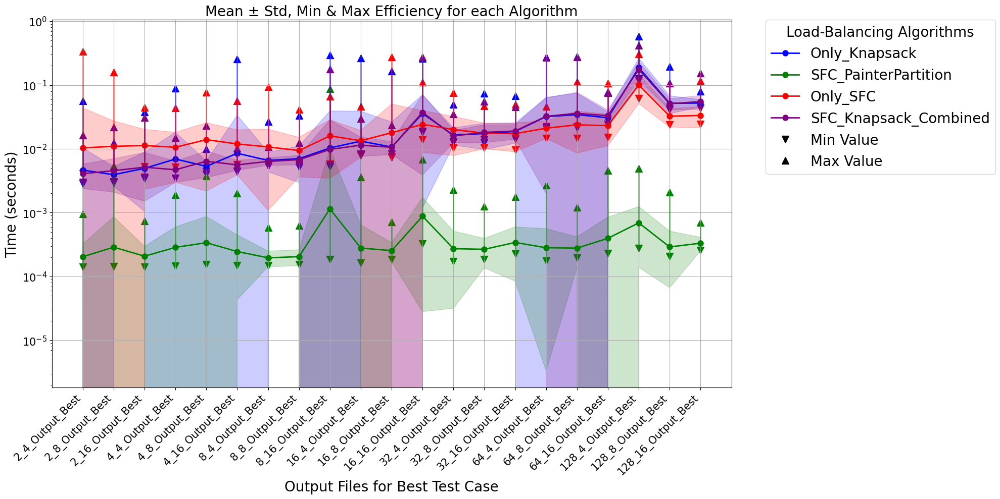

In [24]:


time = ['Only_Knapsack', 'SFC_PainterPartition', 'Only_SFC', 'SFC_Knapsack_Combined']

colors = ['blue', 'green', 'red', 'purple']

fig, ax = plt.subplots(figsize=(20, 10))

for i, alg in enumerate(time):
    alg_name = alg  


    mean_col = f'{alg_name}_Final_Time_mean'
    std_col = f'{alg_name}_Final_Time_std'
    min_col = f'{alg_name}_Final_Time_min'
    max_col = f'{alg_name}_Final_Time_max'

    alg_color = colors[i]
    ax.plot(x, grouped[mean_col], marker='o', color=alg_color, label=alg_name, linewidth=2, markersize=8)
    ax.fill_between(
        x,
        grouped[mean_col] - grouped[std_col],
        grouped[mean_col] + grouped[std_col],
        color=alg_color,
        alpha=0.2
    )
    for j, file_name in enumerate(grouped['File']):
        min_val = grouped[min_col].iloc[j]
        max_val = grouped[max_col].iloc[j]
        ax.plot([x[j], x[j]], [min_val, max_val], color=alg_color, alpha=0.5, linewidth=2)
        ax.scatter(x[j], min_val, color=alg_color, marker='v', s=100)
        ax.scatter(x[j], max_val, color=alg_color, marker='^', s=100)

ax.set_xticks(x)
ax.set_xticklabels(grouped['File'], rotation=45, ha='right')
ax.set_xlabel('Output Files for Best Test Case', fontsize=20)
ax.set_ylabel('Time (seconds)', fontsize=20)
ax.set_title('Mean ± Std, Min & Max Efficiency for each Algorithm', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)

import matplotlib.lines as mlines
min_marker = mlines.Line2D([], [], color='black', marker='v', linestyle='None', markersize=10, label='Min Value')
max_marker = mlines.Line2D([], [], color='black', marker='^', linestyle='None', markersize=10, label='Max Value')

handles, labels = ax.get_legend_handles_labels()
handles += [min_marker, max_marker]
labels += ['Min Value', 'Max Value']

ax.legend(handles, labels, title='Load-Balancing Algorithms', title_fontsize=20, fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
ax.grid(True)
# ax.set_axisbelow(True)
ax.set_yscale('log')
plt.tight_layout()
plt.savefig('./result/time_all_stats_withlog.png', dpi=600)
# plt.savefig('./result/time_all_stats.png', dpi=600)
plt.show()

# colors = ['blue', 'green', 'red', 'purple']

# for i, alg_name in enumerate(time):
#     mean_col = f'{alg_name}_Time_mean'
#     std_col = f'{alg_name}_Time_std'
#     min_col = f'{alg_name}_Time_min'
#     max_col = f'{alg_name}_Time_max'

#     alg_color = colors[i]

#     # Create a new figure for this algorithm
#     fig, ax = plt.subplots(figsize=(20, 10))

#     # Plot mean line with markers
#     ax.plot(x, grouped[mean_col], marker='o', color=alg_color, label=alg_name, linewidth=2, markersize=8)

#     # Fill between mean ± std
#     ax.fill_between(
#         x,
#         grouped[mean_col] - grouped[std_col],
#         grouped[mean_col] + grouped[std_col],
#         color=alg_color,
#         alpha=0.2
#     )

#     # Plot min-max vertical lines and markers
#     for j, file_name in enumerate(grouped['File']):
#         min_val = grouped[min_col].iloc[j]
#         max_val = grouped[max_col].iloc[j]

#         # Vertical line for min-max range
#         ax.plot([x[j], x[j]], [min_val, max_val], color=alg_color, alpha=0.5, linewidth=2)

#         # Min marker (downward triangle)
#         ax.scatter(x[j], min_val, color=alg_color, marker='v', s=100)

#         # Max marker (upward triangle)
#         ax.scatter(x[j], max_val, color=alg_color, marker='^', s=100)

#     # Set x-axis ticks and labels
#     ax.set_xticks(x)
#     ax.set_xticklabels(grouped['File'], rotation=45, ha='right')

#     # Axis labels and title
#     ax.set_xlabel('Output Files for Best Test Case', fontsize=20)
#     ax.set_ylabel('Time (seconds)', fontsize=20)
#     ax.set_title(f'Mean ± Std, Min & Max Time for {alg_name}', fontsize=20)

#     # Increase tick label size
#     ax.tick_params(axis='both', which='major', labelsize=15)

#     # Create custom legend handles for min and max markers
#     min_marker = mlines.Line2D([], [], color='black', marker='v', linestyle='None', markersize=10, label='Min Value')
#     max_marker = mlines.Line2D([], [], color='black', marker='^', linestyle='None', markersize=10, label='Max Value')

#     # Get existing legend handles and labels
#     handles, labels = ax.get_legend_handles_labels()
#     handles += [min_marker, max_marker]
#     labels += ['Min Value', 'Max Value']

#     # Create the combined legend
#     ax.legend(handles, labels, title='Load-Balancing Algorithm', title_fontsize=20, fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

#     # Add a grid and ensure it is behind the data
#     ax.grid(True)
#     ax.set_axisbelow(True)
#     ax.set_yscale('log')
#     plt.tight_layout()

#     # Optionally save each figure separately
#     # filename = f"./result/{alg_name}_time_stats.png"
#     # plt.savefig(filename, dpi=600)

#     plt.show()

In [25]:
grouped

,File,Only_Knapsack_Efficiency_mean,Only_Knapsack_Efficiency_std,Only_Knapsack_Efficiency_min,Only_Knapsack_Efficiency_max,SFC_PainterPartition_Efficiency_mean,SFC_PainterPartition_Efficiency_std,SFC_PainterPartition_Efficiency_min,SFC_PainterPartition_Efficiency_max,Only_SFC_Efficiency_mean,Only_SFC_Efficiency_std,Only_SFC_Efficiency_min,Only_SFC_Efficiency_max,SFC_Knapsack_Combined_Efficiency_mean,SFC_Knapsack_Combined_Efficiency_std,SFC_Knapsack_Combined_Efficiency_min,SFC_Knapsack_Combined_Efficiency_max,Only_Knapsack_Final_Time_mean,Only_Knapsack_Final_Time_std,Only_Knapsack_Final_Time_min,Only_Knapsack_Final_Time_max,SFC_PainterPartition_Final_Time_mean,SFC_PainterPartition_Final_Time_std,SFC_PainterPartition_Final_Time_min,SFC_PainterPartition_Final_Time_max,Only_SFC_Final_Time_mean,Only_SFC_Final_Time_std,Only_SFC_Final_Time_min,Only_SFC_Final_Time_max,SFC_Knapsack_Combined_Final_Time_mean,SFC_Knapsack_Combined_Final_Time_std,SFC_Knapsack_Combined_Final_Time_min,SFC_Knapsack_Combined_Final_Time_max
0,2_4_Output_Best,0.999858,0.000145,0.999167,0.999999,0.999359,0.000470,0.998126,0.999997,0.911840,0.099339,0.799466,0.999991,0.778783,0.247178,0.500640,0.998531,0.004633,0.005707,0.002829,0.055911,0.000204,0.000119,0.000140,0.000954,0.010350,0.033404,0.004093,0.337605,0.004080,0.001697,0.002999,0.016212
1,2_8_Output_Best,0.999939,0.000059,0.999668,0.999998,0.999480,0.000359,0.998655,0.999997,0.947655,0.055284,0.888533,0.999984,0.843574,0.165754,0.667430,0.999797,0.003939,0.001332,0.002935,0.012486,0.000288,0.000574,0.000143,0.005411,0.010956,0.016441,0.004286,0.159472,0.004551,0.002455,0.003060,0.021776
2,2_16_Output_Best,0.999974,0.000028,0.999862,1.000000,0.999652,0.000265,0.998922,0.999998,0.968825,0.029194,0.940980,0.999983,0.895014,0.098834,0.801321,0.999789,0.004948,0.003901,0.003394,0.037659,0.000208,0.000089,0.000141,0.000734,0.011263,0.008936,0.005253,0.044389,0.005152,0.003644,0.003589,0.030857
3,4_4_Output_Best,0.999792,0.000131,0.999458,0.999981,0.998712,0.000589,0.997180,0.999747,0.858147,0.090340,0.799042,0.999684,0.644867,0.225489,0.500467,0.997453,0.006920,0.011269,0.003478,0.088394,0.000286,0.000313,0.000147,0.001912,0.010584,0.007599,0.005208,0.044001,0.004704,0.001723,0.003507,0.014993
4,4_8_Output_Best,0.999903,0.000063,0.999703,0.999987,0.999115,0.000420,0.997640,0.999948,0.916906,0.047683,0.888629,0.999948,0.751113,0.143540,0.667313,0.999226,0.005325,0.001126,0.004046,0.010090,0.000338,0.000530,0.000155,0.003770,0.013935,0.011748,0.005565,0.076241,0.006395,0.002863,0.004372,0.023110
5,4_16_Output_Best,0.999957,0.000026,0.999885,0.999996,0.999354,0.000283,0.998567,0.999902,0.953766,0.023630,0.940997,0.999805,0.843864,0.080468,0.801407,0.999534,0.008518,0.025149,0.004441,0.256300,0.000246,0.000203,0.000149,0.002015,0.011925,0.007994,0.005703,0.056507,0.005603,0.000999,0.004470,0.010171
6,8_4_Output_Best,0.999904,0.000041,0.999795,0.999966,0.998745,0.000428,0.997266,0.999629,0.898170,0.029794,0.888569,0.999629,0.694894,0.089805,0.667092,0.998552,0.006591,0.002234,0.005355,0.026887,0.000196,0.000054,0.000150,0.000580,0.010720,0.009633,0.006007,0.093884,0.006360,0.000846,0.005429,0.010660
7,8_8_Output_Best,0.999954,0.000019,0.999910,0.999992,0.999088,0.000341,0.997884,0.999681,0.947354,0.017263,0.940896,0.999481,0.822100,0.059136,0.801412,0.999168,0.007002,0.004038,0.005190,0.033316,0.000204,0.000057,0.000156,0.000625,0.009395,0.005765,0.005987,0.041104,0.006760,0.001171,0.005540,0.012458
8,8_16_Output_Best,0.999979,0.000008,0.999959,0.999994,0.999332,0.000205,0.998755,0.999709,0.975324,0.011327,0.969564,0.999678,0.909389,0.042333,0.889200,0.999631,0.010316,0.029046,0.005291,0.294824,0.001149,0.008739,0.000186,0.087652,0.015960,0.012503,0.005770,0.066786,0.009777,0.018674,0.005708,0.178892
9,16_4_Output_Best,0.999892,0.000038,0.999783,0.999976,0.998435,0.000441,0.997122,0.999345,0.893796,0.021433,0.888591,0.998588,0.681673,0.064798,0.667070,0.998155,0.013198,0.025690,0.007830,0.266687,0.000279,0.000366,0.00

In [26]:
columns_to_keep = ['File','Only_Knapsack_Efficiency_mean', 'Only_SFC_Efficiency_mean', 'SFC_PainterPartition_Efficiency_mean', 'SFC_Knapsack_Combined_Efficiency_mean', 'Only_Knapsack_Final_Time_mean', 'Only_SFC_Final_Time_mean', 'SFC_PainterPartition_Final_Time_mean', 'SFC_Knapsack_Combined_Final_Time_mean' ]
new_df = grouped[columns_to_keep]


In [27]:
new_df

,File,Only_Knapsack_Efficiency_mean,Only_SFC_Efficiency_mean,SFC_PainterPartition_Efficiency_mean,SFC_Knapsack_Combined_Efficiency_mean,Only_Knapsack_Final_Time_mean,Only_SFC_Final_Time_mean,SFC_PainterPartition_Final_Time_mean,SFC_Knapsack_Combined_Final_Time_mean
0,2_4_Output_Best,0.999858,0.911840,0.999359,0.778783,0.004633,0.010350,0.000204,0.004080
1,2_8_Output_Best,0.999939,0.947655,0.999480,0.843574,0.003939,0.010956,0.000288,0.004551
2,2_16_Output_Best,0.999974,0.968825,0.999652,0.895014,0.004948,0.011263,0.000208,0.005152
3,4_4_Output_Best,0.999792,0.858147,0.998712,0.644867,0.006920,0.010584,0.000286,0.004704
4,4_8_Output_Best,0.999903,0.916906,0.999115,0.751113,0.005325,0.013935,0.000338,0.006395
5,4_16_Output_Best,0.999957,0.953766,0.999354,0.843864,0.008518,0.011925,0.000246,0.005603
6,8_4_Output_Best,0.999904,0.898170,0.998745,0.694894,0.006591,0.010720,0.000196,0.006360
7,8_8_Output_Best,0.999954,0.947354,0.999088,0.822100,0.007002,0.009395,0.000204,0.006760
8,8_16_Output_Best,0.999979,0.975324,0.999332,0.909389,0.010316,0.015960,0.001149,0.009777
9,16_4_Output_Best,0.999892,0.893796,0.998435,0.681673,0.013198,0.013413,0.000279,0.011426


In [ ]:
# algorithms = [
#     ('Only_Knapsack', 'Only_Knapsack_Efficiency', 'Only_Knapsack_Final_Time'),
#     ('Only_SFC', 'Only_SFC_Efficiency', 'Only_SFC_Final_Time'),
#     ('SFC_PainterPartition', 'SFC_PainterPartition_Efficiency', 'SFC_PainterPartition_Final_Time'),
#     ('SFC_Knapsack_Combined', 'SFC_Knapsack_Combined_Efficiency', 'SFC_Knapsack_Combined_Final_Time')
# ]

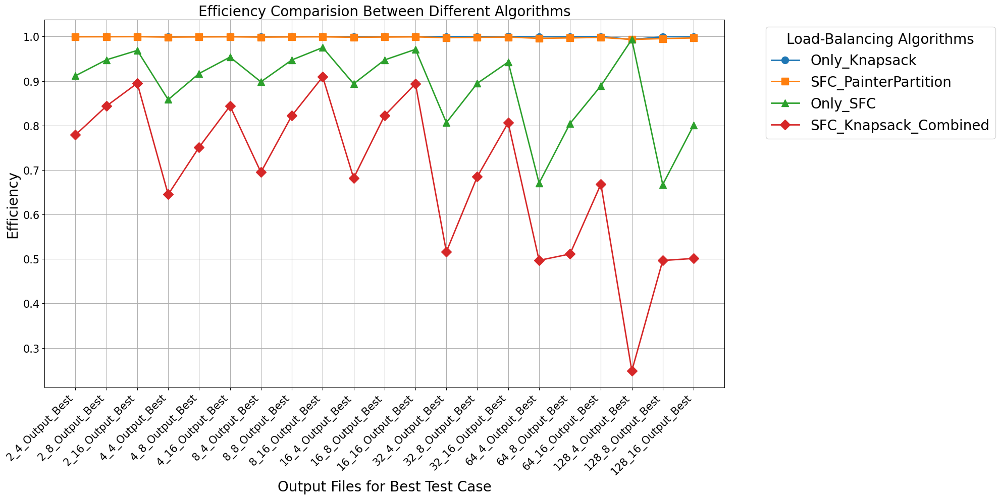

In [28]:
algorithms = [
    ('Only_Knapsack', 'Only_Knapsack_Efficiency_mean', 'Only_Knapsack_Final_Time_mean', 'o'),
    ('SFC_PainterPartition', 'SFC_PainterPartition_Efficiency_mean', 'SFC_PainterPartition_Final_Time_mean', 's'),
    ('Only_SFC', 'Only_SFC_Efficiency_mean', 'Only_SFC_Final_Time_mean', '^'),
    ('SFC_Knapsack_Combined', 'SFC_Knapsack_Combined_Efficiency_mean', 'SFC_Knapsack_Combined_Final_Time_mean', 'D')
]

x = np.arange(len(new_df['File']))
fig, ax = plt.subplots(figsize=(20, 10))

for alg_name, eff_col, time_col, marker in algorithms:
    ax.plot(x, new_df[eff_col], marker=marker, markersize=10, linewidth=2, label=alg_name)
ax.set_xticks(x)
ax.set_xticklabels(new_df['File'], rotation=45, ha='right')
ax.set_xlabel('Output Files for Best Test Case', fontsize=20)
ax.set_ylabel('Efficiency', fontsize=20)
ax.set_title('Efficiency Comparision Between Different Algorithms', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)

ax.legend(title='Load-Balancing Algorithms', title_fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20)
ax.grid(True)
ax.set_axisbelow(True)
plt.tight_layout()
plt.savefig('./result/efficiency.png', dpi=600)
plt.show()

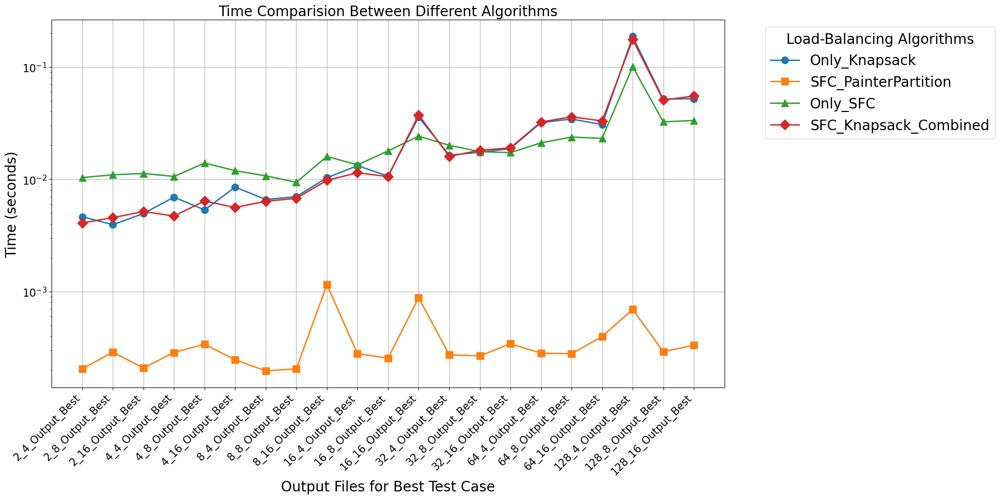

In [32]:
# fig, ax = plt.subplots(figsize=(20, 10))

# for alg_name, eff_col, time_col, marker in algorithms:
#     ax.plot(x, new_df[time_col], marker=marker, markersize=10, linewidth=2, label=alg_name)
# ax.set_xticks(x)
# ax.set_xticklabels(new_df['File'], rotation=45, ha='right')
# ax.set_xlabel('File', fontsize=15)
# ax.set_ylabel('Time (seconds)', fontsize=15)
# ax.set_title('Time Means by File and Algorithm', fontsize=20)
# ax.tick_params(axis='both', which='major', labelsize=15)
# ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20)

# plt.tight_layout()
# plt.show()


x = np.arange(len(new_df['File']))
fig, ax = plt.subplots(figsize=(20, 10))

for alg_name, eff_col, time_col, marker in algorithms:
    ax.plot(x, new_df[time_col], marker=marker, markersize=10, linewidth=2, label=alg_name)
ax.set_xticks(x)
ax.set_xticklabels(new_df['File'], rotation=45, ha='right')
ax.set_xlabel('Output Files for Best Test Case', fontsize=20)
ax.set_ylabel('Time (seconds)', fontsize=20)
ax.set_title('Time Comparision Between Different Algorithms', fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)

ax.legend(title='Load-Balancing Algorithms', title_fontsize=20, bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=20)
ax.grid(True)
ax.set_axisbelow(True)
ax.set_yscale('log')
plt.tight_layout()
plt.savefig('./result/time.png', dpi=600)
plt.show()